In [32]:
import csv
import os
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.ticker as ticker

In [33]:
#Load Data and Create Path

health_data_to_load = Path('Resources','VSRR_Provisional_Drug_Overdose_Death_Counts.csv')

health_data = pd.read_csv(health_data_to_load)


health_data


,State,Year,Month,Period,Indicator,Data Value,Percent Complete,Percent Pending Investigation,State Name,Footnote,Footnote Symbol,Predicted Value
0,AK,2015,April,12 month-ending,"Synthetic opioids, excl. methadone (T40.4)",NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
1,AK,2015,April,12 month-ending,Cocaine (T40.5),NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
2,AK,2015,April,12 month-ending,"Opioids (T40.0-T40.4,T40.6)",NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
3,AK,2015,April,12 month-ending,"Natural & semi-synthetic opioids, incl. methad...",NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
4,AK,2015,April,12 month-ending,Number of Deaths,4133,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
57595,YC,2022,September,12 month-ending,"Natural, semi-synthetic, & synthetic opioids, ...",2503,99.5+,0,New York City,Underreported due to incomplete data.,*,2559
57596,YC,2022,September,12 month-ending,Number of Drug Overdose Deaths,2970,99.5+,0,New York City,Underreported due to incomplete data.,*,3029
57597,YC,2022,September,12 month-ending,Natural & semi-synthetic opioids (T40.2),464,99.5+,0,New York City,Underreported due to incomplete data.,*,475
57598,YC,2022,September,12 month-ending,"Synthetic opioids, excl. methadone (T40.4)",2377,99.5+,0,New York City,Underreported due to incomplete data.,*,2431


In [34]:

#Read each row

health_data.to_csv('health_data.csv', index=False)

with open('health_data.csv', encoding='UTF-8') as csvfile:
    csvreader = csv.reader(csvfile, delimiter=',')
    print(csvreader)

    csv_header = next(csvreader)
    print(f"CSV Header: {csv_header}")

    for row in csvreader:
        print(row)


CSV Header: ['State', 'Year', 'Month', 'Period', 'Indicator', 'Data Value', 'Percent Complete', 'Percent Pending Investigation', 'State Name', 'Footnote', 'Footnote Symbol', 'Predicted Value']
['AK', '2015', 'April', '12 month-ending', 'Synthetic opioids, excl. methadone (T40.4)', '', '100', '0.0', 'Alaska', 'Numbers may differ from published reports using final data. See Technical Notes.  Data not shown due to low data quality.', '**', '']
['AK', '2015', 'April', '12 month-ending', 'Cocaine (T40.5)', '', '100', '0.0', 'Alaska', 'Numbers may differ from published reports using final data. See Technical Notes.  Data not shown due to low data quality.', '**', '']
['AK', '2015', 'April', '12 month-ending', 'Opioids (T40.0-T40.4,T40.6)', '', '100', '0.0', 'Alaska', 'Numbers may differ from published reports using final data. See Technical Notes.  Data not shown due to low data quality.', '**', '']
['AK', '2015', 'April', '12 month-ending', 'Natural & semi-synthetic opioids, incl. methadone

In [35]:
#Look at Columns
health_data.columns

Index(['State', 'Year', 'Month', 'Period', 'Indicator', 'Data Value',
       'Percent Complete', 'Percent Pending Investigation', 'State Name',
       'Footnote', 'Footnote Symbol', 'Predicted Value'],
      dtype='object')

In [36]:
health_data['State'].unique()

array(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA',
       'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME',
       'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM',
       'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'US', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY', 'YC'], dtype=object)

In [37]:
#Check which States are included
health_data['State'].unique()
remove_indicators = ['US','YC']

health_data = health_data[~health_data['State'].isin(remove_indicators)]



In [38]:
health_data['State'].unique()

array(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA',
       'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME',
       'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM',
       'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY'], dtype=object)

In [39]:
#Check which States are included
health_data['State'].unique()

array(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA',
       'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME',
       'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM',
       'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY'], dtype=object)

In [40]:
#Which drug was listed as COD
health_data['Indicator'].unique()

array(['Synthetic opioids, excl. methadone (T40.4)', 'Cocaine (T40.5)',
       'Opioids (T40.0-T40.4,T40.6)',
       'Natural & semi-synthetic opioids, incl. methadone (T40.2, T40.3)',
       'Number of Deaths', 'Heroin (T40.1)',
       'Number of Drug Overdose Deaths',
       'Natural & semi-synthetic opioids (T40.2)',
       'Psychostimulants with abuse potential (T43.6)',
       'Percent with drugs specified',
       'Natural, semi-synthetic, & synthetic opioids, incl. methadone (T40.2-T40.4)',
       'Methadone (T40.3)'], dtype=object)

In [41]:
health_data['Indicator'].value_counts()

Number of Deaths                                                               4896
Number of Drug Overdose Deaths                                                 4896
Percent with drugs specified                                                   4896
Synthetic opioids, excl. methadone (T40.4)                                     4512
Cocaine (T40.5)                                                                4512
Opioids (T40.0-T40.4,T40.6)                                                    4512
Natural & semi-synthetic opioids, incl. methadone (T40.2, T40.3)               4512
Heroin (T40.1)                                                                 4512
Natural & semi-synthetic opioids (T40.2)                                       4512
Psychostimulants with abuse potential (T43.6)                                  4512
Natural, semi-synthetic, & synthetic opioids, incl. methadone (T40.2-T40.4)    4512
Methadone (T40.3)                                                           

In [42]:
health_data['State'].value_counts()

AK    1152
MO    1152
MT    1152
NC    1152
NH    1152
NJ    1152
NM    1152
NV    1152
NY    1152
OH    1152
OK    1152
OR    1152
RI    1152
SC    1152
SD    1152
TN    1152
TX    1152
UT    1152
VA    1152
VT    1152
WA    1152
WI    1152
WV    1152
AL    1152
MS    1152
MN    1152
MI    1152
AR    1152
AZ    1152
CA    1152
CO    1152
CT    1152
DC    1152
DE    1152
FL    1152
GA    1152
HI    1152
IA    1152
WY    1152
ID    1152
IL    1152
IN    1152
KS    1152
KY    1152
MA    1152
MD    1152
ME    1152
LA     288
NE     288
ND     288
PA     288
Name: State, dtype: int64

In [43]:
unique_state = health_data['State'].unique()
num_states = len(unique_state)

print(num_states)

51


In [44]:
health_data['Year'].unique()

array([2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022], dtype=int64)

In [62]:
health_data

,State,Year,Month,Period,Indicator,Data Value,Percent Complete,Percent Pending Investigation,State Name,Footnote,Footnote Symbol,Predicted Value
0,AK,2015,April,12 month-ending,"Synthetic opioids, excl. methadone (T40.4)",NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
1,AK,2015,April,12 month-ending,Cocaine (T40.5),NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
2,AK,2015,April,12 month-ending,"Opioids (T40.0-T40.4,T40.6)",NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
3,AK,2015,April,12 month-ending,"Natural & semi-synthetic opioids, incl. methad...",NaN,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
4,AK,2015,April,12 month-ending,Number of Deaths,4133,100,0,Alaska,Numbers may differ from published reports usin...,**,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
56443,WY,2022,September,12 month-ending,"Natural, semi-synthetic, & synthetic opioids, ...",75,99.5+,0,Wyoming,Underreported due to incomplete data.,*,76
56444,WY,2022,September,12 month-ending,Number of Drug Overdose Deaths,118,99.5+,0,Wyoming,Underreported due to incomplete data.,*,119
56445,WY,2022,September,12 month-ending,Natural & semi-synthetic opioids (T40.2),33,99.5+,0,Wyoming,Underreported due to incomplete data.,*,34
56446,WY,2022,September,12 month-ending,"Synthetic opioids, excl. methadone (T40.4)",49,99.5+,0,Wyoming,Underreported due to incomplete data.,*,50


In [63]:

clean_health_data = health_data.groupby(['Year', 'Indicator'])['Data Value'].sum()


clean_health_data = clean_health_data.reset_index()


state_health_data = health_data.groupby(['Year', 'Indicator','State Name'])['Data Value'].sum()

state_health_data = state_health_data.reset_index()




#clean_health_data = clean_health_data.drop('State', axis = 1)

#clean_health_data = clean_health_data.drop('Period', axis = 1)

pd.set_option('display.float_format', lambda x: '%.0f' % x)


clean_health_data



,Year,Indicator,Data Value
0,2015,Cocaine (T40.5),31935
1,2015,Heroin (T40.1),64574
2,2015,Methadone (T40.3),17428
3,2015,Natural & semi-synthetic opioids (T40.2),70669
4,2015,"Natural & semi-synthetic opioids, incl. methad...",84039
...,...,...,...
91,2022,Number of Drug Overdose Deaths,1250433
92,2022,"Opioids (T40.0-T40.4,T40.6)",866800
93,2022,Percent with drugs specified,58809
94,2022,Psychostimulants with abuse potential (T43.6),375438


In [81]:
state_health_data 

state_data_16 = pd.DataFrame(state_health_data.loc[state_health_data['Year']==2016,:])
state_data_17 = pd.DataFrame(state_health_data.loc[state_health_data['Year']==2017,:])
state_data_18= pd.DataFrame(state_health_data.loc[state_health_data['Year']==2018,:])
state_data_19 = pd.DataFrame(state_health_data.loc[state_health_data['Year']==2019,:])
state_data_20 = pd.DataFrame(state_health_data.loc[state_health_data['Year']==2020,:])
state_data_21 = pd.DataFrame(state_health_data.loc[state_health_data['Year']==2021,:])
state_data_22 = pd.DataFrame(state_health_data.loc[state_health_data['Year']==2022,:])

#state_data_16.reset_index(drop =True)
#state_data_17.reset_index(drop =True)
#state_data_18.reset_index(drop =True)
#state_data_19.reset_index(drop =True)
#state_data_20.reset_index(drop =True)
#state_data_21.reset_index(drop =True)
#state_data_22.reset_index(drop =True)


state_data_22 = state_data_22.reset_index(drop = True)

state_data_22




,Year,Indicator,State Name,Data Value
0,2022,Cocaine (T40.5),Alabama,1928
1,2022,Cocaine (T40.5),Alaska,100
2,2022,Cocaine (T40.5),Arizona,2698
3,2022,Cocaine (T40.5),Arkansas,730
4,2022,Cocaine (T40.5),California,17322
...,...,...,...,...
571,2022,"Synthetic opioids, excl. methadone (T40.4)",Virginia,23627
572,2022,"Synthetic opioids, excl. methadone (T40.4)",Washington,18286
573,2022,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,13062
574,2022,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,15887


In [82]:
state_data_16 = state_data_16.reset_index(drop = True)

state_data_16



,Year,Indicator,State Name,Data Value
0,2016,Cocaine (T40.5),Alabama,0
1,2016,Cocaine (T40.5),Alaska,112
2,2016,Cocaine (T40.5),Arizona,0
3,2016,Cocaine (T40.5),Arkansas,0
4,2016,Cocaine (T40.5),California,0
...,...,...,...,...
571,2016,"Synthetic opioids, excl. methadone (T40.4)",Virginia,5525
572,2016,"Synthetic opioids, excl. methadone (T40.4)",Washington,935
573,2016,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,3746
574,2016,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,2389


In [83]:

state_data_17 = state_data_17.reset_index(drop= True)

state_data_17


,Year,Indicator,State Name,Data Value
0,2017,Cocaine (T40.5),Alabama,0
1,2017,Cocaine (T40.5),Alaska,224
2,2017,Cocaine (T40.5),Arizona,866
3,2017,Cocaine (T40.5),Arkansas,0
4,2017,Cocaine (T40.5),California,0
...,...,...,...,...
571,2017,"Synthetic opioids, excl. methadone (T40.4)",Virginia,8781
572,2017,"Synthetic opioids, excl. methadone (T40.4)",Washington,1291
573,2017,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,7094
574,2017,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,4408


In [84]:
state_data_18 = state_data_18.reset_index(drop= True)

state_data_18


,Year,Indicator,State Name,Data Value
0,2018,Cocaine (T40.5),Alabama,0
1,2018,Cocaine (T40.5),Alaska,100
2,2018,Cocaine (T40.5),Arizona,1898
3,2018,Cocaine (T40.5),Arkansas,0
4,2018,Cocaine (T40.5),California,0
...,...,...,...,...
571,2018,"Synthetic opioids, excl. methadone (T40.4)",Virginia,9801
572,2018,"Synthetic opioids, excl. methadone (T40.4)",Washington,2203
573,2018,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,7124
574,2018,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,5957


In [85]:
state_data_19 = state_data_19.reset_index(drop= True)

state_data_19


,Year,Indicator,State Name,Data Value
0,2019,Cocaine (T40.5),Alabama,0
1,2019,Cocaine (T40.5),Alaska,116
2,2019,Cocaine (T40.5),Arizona,1940
3,2019,Cocaine (T40.5),Arkansas,0
4,2019,Cocaine (T40.5),California,5468
...,...,...,...,...
571,2019,"Synthetic opioids, excl. methadone (T40.4)",Virginia,10836
572,2019,"Synthetic opioids, excl. methadone (T40.4)",Washington,3274
573,2019,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,6605
574,2019,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,6845


In [86]:
state_data_20 = state_data_20.reset_index(drop= True)

state_data_20

,Year,Indicator,State Name,Data Value
0,2020,Cocaine (T40.5),Alabama,0
1,2020,Cocaine (T40.5),Alaska,125
2,2020,Cocaine (T40.5),Arizona,2153
3,2020,Cocaine (T40.5),Arkansas,0
4,2020,Cocaine (T40.5),California,13280
...,...,...,...,...
571,2020,"Synthetic opioids, excl. methadone (T40.4)",Virginia,15985
572,2020,"Synthetic opioids, excl. methadone (T40.4)",Washington,6004
573,2020,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,9666
574,2020,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,10762


In [87]:
state_data_21 = state_data_21.reset_index(drop= True)

state_data_21

,Year,Indicator,State Name,Data Value
0,2021,Cocaine (T40.5),Alabama,0
1,2021,Cocaine (T40.5),Alaska,210
2,2021,Cocaine (T40.5),Arizona,2310
3,2021,Cocaine (T40.5),Arkansas,170
4,2021,Cocaine (T40.5),California,15843
...,...,...,...,...
571,2021,"Synthetic opioids, excl. methadone (T40.4)",Virginia,22816
572,2021,"Synthetic opioids, excl. methadone (T40.4)",Washington,11192
573,2021,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,14433
574,2021,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,14277


In [88]:
state_data_22 = state_data_22.reset_index(drop= True)

state_data_22


,Year,Indicator,State Name,Data Value
0,2022,Cocaine (T40.5),Alabama,1928
1,2022,Cocaine (T40.5),Alaska,100
2,2022,Cocaine (T40.5),Arizona,2698
3,2022,Cocaine (T40.5),Arkansas,730
4,2022,Cocaine (T40.5),California,17322
...,...,...,...,...
571,2022,"Synthetic opioids, excl. methadone (T40.4)",Virginia,23627
572,2022,"Synthetic opioids, excl. methadone (T40.4)",Washington,18286
573,2022,"Synthetic opioids, excl. methadone (T40.4)",West Virginia,13062
574,2022,"Synthetic opioids, excl. methadone (T40.4)",Wisconsin,15887


In [46]:
#Format Column to Percent
#clean_health_data['Percent Pending Investigation'] = clean_health_data['Percent Pending Investigation']  * 100
#clean_health_data['Percent Pending Investigation'] = clean_health_data['Percent Pending Investigation'].astype(float).map("{:.2f}%".format)


#clean_health_data

In [47]:
#Created a new Data Frame for each year

k16_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2016,:])
k17_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2017,:])
k18_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2018,:])
k19_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2019,:])
k20_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2020,:])
k21_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2021,:])
k22_OD_Data = pd.DataFrame(clean_health_data.loc[clean_health_data['Year']==2022,:])

k18_OD_Data.reset_index(drop =True)
k16_OD_Data.reset_index(drop =True)
k17_OD_Data.reset_index(drop =True)
k19_OD_Data.reset_index(drop =True)
k20_OD_Data.reset_index(drop =True)
k21_OD_Data.reset_index(drop =True)
k22_OD_Data.reset_index(drop =True)





,Year,Indicator,Data Value
0,2022,Cocaine (T40.5),271060
1,2022,Heroin (T40.1),71127
2,2022,Methadone (T40.3),33631
3,2022,Natural & semi-synthetic opioids (T40.2),133523
4,2022,"Natural & semi-synthetic opioids, incl. methad...",162763
5,2022,"Natural, semi-synthetic, & synthetic opioids, ...",844171
6,2022,Number of Deaths,40232554
7,2022,Number of Drug Overdose Deaths,1250433
8,2022,"Opioids (T40.0-T40.4,T40.6)",866800
9,2022,Percent with drugs specified,58809


In [48]:
k22_OD_Data

,Year,Indicator,Data Value
84,2022,Cocaine (T40.5),271060
85,2022,Heroin (T40.1),71127
86,2022,Methadone (T40.3),33631
87,2022,Natural & semi-synthetic opioids (T40.2),133523
88,2022,"Natural & semi-synthetic opioids, incl. methad...",162763
89,2022,"Natural, semi-synthetic, & synthetic opioids, ...",844171
90,2022,Number of Deaths,40232554
91,2022,Number of Drug Overdose Deaths,1250433
92,2022,"Opioids (T40.0-T40.4,T40.6)",866800
93,2022,Percent with drugs specified,58809


In [49]:
#Store the "Data Value" and "Indicator Column"
k22_Indicator = k22_OD_Data['Indicator']
k22_Values = k22_OD_Data['Data Value']

"Remove the Number of Deaths and Number of Drug Overdose Deaths values"
indicators_to_remove = ['Number of Deaths', 'Number of Drug Overdose Deaths','Percent with drugs specified', 'Natural & semi-synthetic opioids(T40.2)']

k22_OD_Data = k22_OD_Data[~k22_OD_Data['Indicator'].isin(indicators_to_remove)]

print(k22_OD_Data)

    Year                                          Indicator  Data Value
84  2022                                    Cocaine (T40.5)      271060
85  2022                                     Heroin (T40.1)       71127
86  2022                                  Methadone (T40.3)       33631
87  2022           Natural & semi-synthetic opioids (T40.2)      133523
88  2022  Natural & semi-synthetic opioids, incl. methad...      162763
89  2022  Natural, semi-synthetic, & synthetic opioids, ...      844171
92  2022                        Opioids (T40.0-T40.4,T40.6)      866800
94  2022      Psychostimulants with abuse potential (T43.6)      375438
95  2022         Synthetic opioids, excl. methadone (T40.4)      771979


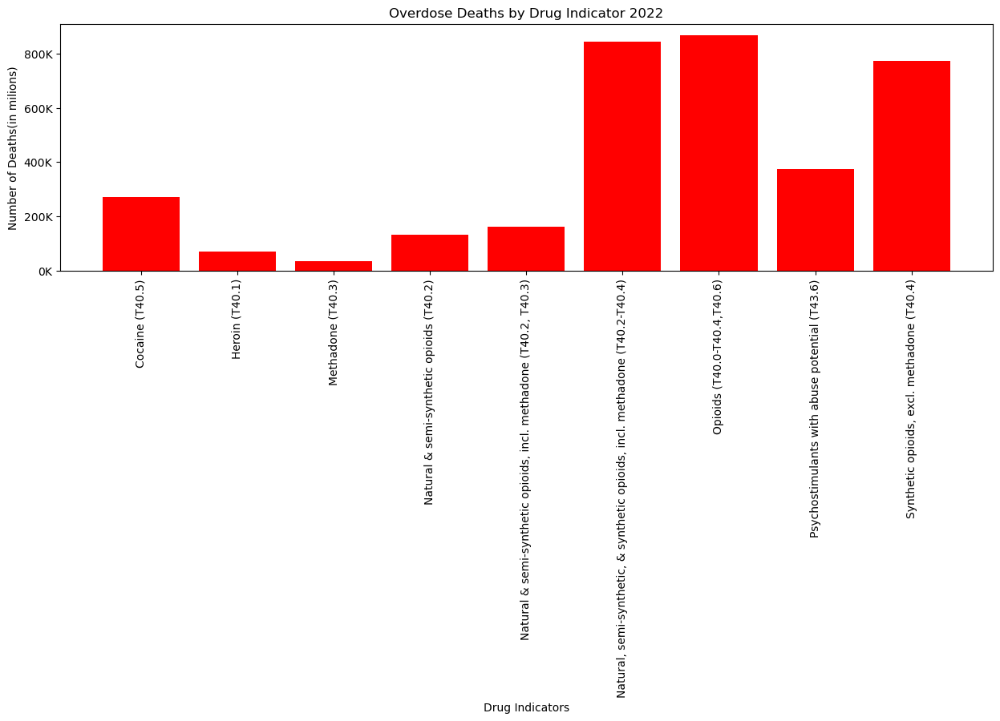

In [61]:
#Plot Deaths by Drug for 2022
plt.figure(figsize=(15,4))

plt.bar(k22_OD_Data['Indicator'], k22_OD_Data['Data Value'], color = 'red')

formatter = ticker.FuncFormatter(lambda x, pos: f'{x / 1000:.0f}K')
plt.gca().yaxis.set_major_formatter(formatter)

plt.title("Overdose Deaths by Drug Indicator 2022")

plt.xlabel("Drug Indicators")

plt.ylabel("Number of Deaths(in milions)")


plt.xticks(rotation= 'vertical')


output_file = os.path.join('Resources', 'Overdose_Deaths_by_Year.png')
plt.savefig(output_file)



plt.show()

In [51]:
#Keep only opiod Data
indicators_to_keep = ['Opioids (T40.0-T40.4,T40.6)', 'Synthetic opioids, excl. methadone (T40.4)']


# Create a new DataFrame with the desired indicators
opiod_death_data = clean_health_data[clean_health_data['Indicator'].isin(indicators_to_keep)]


opiod_death_data.groupby(['Indicator'])
opiod_death_data 

,Year,Indicator,Data Value
8,2015,"Opioids (T40.0-T40.4,T40.6)",169995
11,2015,"Synthetic opioids, excl. methadone (T40.4)",45586
20,2016,"Opioids (T40.0-T40.4,T40.6)",255568
23,2016,"Synthetic opioids, excl. methadone (T40.4)",108155
32,2017,"Opioids (T40.0-T40.4,T40.6)",311315
35,2017,"Synthetic opioids, excl. methadone (T40.4)",179450
44,2018,"Opioids (T40.0-T40.4,T40.6)",356740
47,2018,"Synthetic opioids, excl. methadone (T40.4)",240969
56,2019,"Opioids (T40.0-T40.4,T40.6)",450112
59,2019,"Synthetic opioids, excl. methadone (T40.4)",315382


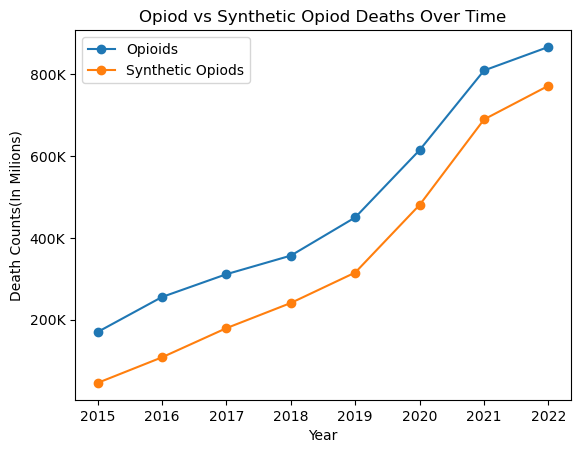

In [59]:
#Seperate sythentic 
opiods_df  = opiod_death_data[opiod_death_data['Indicator'] == 'Opioids (T40.0-T40.4,T40.6)']
synthetic_df = opiod_death_data[opiod_death_data['Indicator'] == 'Synthetic opioids, excl. methadone (T40.4)']

#opiods_df['Data Value'] = opiods_df['Data Value'].astype(int)

#opiods_df["Data Value"] = opiods_df["Data Value"].astype(float).map("{:,.0f}".format)
#synthetic_df["Data Value"] = synthetic_df["Data Value"].astype(float).map("{:,.0f}".format)

plt.plot(opiods_df['Year'], opiods_df['Data Value'], marker = 'o', label = 'Opioids')
plt.plot(synthetic_df['Year'], synthetic_df['Data Value'], marker = 'o', label = 'Synthetic Opiods')

formatter = ticker.FuncFormatter(lambda x, pos: f'{x / 1000:.0f}K')
plt.gca().yaxis.set_major_formatter(formatter)


#plt.yticks(np.arange(0, max(int(opiods_df["Data Value"]), 100000)))

#plt.set_yticklabels(['{:,.0f}'.format(y) for y in opiods_df["Data Value"]])


plt.xlabel('Year')
plt.ylabel('Death Counts(In Milions)')
plt.title('Opiod vs Synthetic Opiod Deaths Over Time')
plt.legend()



output_file = os.path.join('Resources', 'Opiod_vs_Sythnetic.png')
plt.savefig(output_file)